In [9]:
from pathlib import Path

import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
from rasterio.enums import Resampling

RGB_DIR = Path("rgb")
LABEL_DIR = Path("2020weinstein_labels")

In [10]:
# Pick a tile and derive its geo_index for label matching.
tile_path = RGB_DIR / "2019_TEAK_4_313000_4092000_image.tif"
year, site, _visit, east, north, _ = tile_path.stem.split("_")
geo_index = f"{east}_{north}"
print(f"site={site} year={year} geo_index={geo_index}")

site=TEAK year=2019 geo_index=313000_4092000


In [11]:
# Load the RGB tile downsampled for display. Native NEON RGB is 10000x10000 at 0.1 m;
# read it at 1/5 resolution (2000x2000 ~= 0.5 m) for plotting speed.
DISPLAY_SCALE = 5

with rasterio.open(tile_path) as src:
    print(f"native shape: {src.height}x{src.width}, dtype: {src.dtypes[0]}")
    print(f"bounds: {src.bounds}")
    print(f"crs: {src.crs}")

    H_disp = src.height // DISPLAY_SCALE
    W_disp = src.width // DISPLAY_SCALE
    img = src.read(
        [1, 2, 3],
        out_shape=(3, H_disp, W_disp),
        resampling=Resampling.bilinear,
    )
    full_transform = src.transform   # native-res; we'll scale into display pixels

img = np.transpose(img, (1, 2, 0))
# Stretch to [0, 1] for display, ignoring zero borders.
nz = img[img > 0]
lo, hi = np.percentile(nz, (2, 98)) if nz.size else (0, 1)
img_disp = np.clip((img.astype(np.float32) - lo) / max(hi - lo, 1e-6), 0, 1)
print(f"display shape: {img_disp.shape}, value range: [{lo:.0f}, {hi:.0f}]")

native shape: 10000x10000, dtype: uint8
bounds: BoundingBox(left=313000.0, bottom=4092000.0, right=314000.0, top=4093000.0)
crs: EPSG:32611
display shape: (2000, 2000, 3), value range: [54, 211]


In [12]:
# Load just the rows for this tile from the big site CSV.
# CSV has UTM box coords (left, bottom, right, top) and geo_index = 'easting_northing'.
labels = pd.read_csv(
    LABEL_DIR / f"{site}_{year}.csv",
    usecols=["left", "bottom", "right", "top", "score", "geo_index"],
)
tile_labels = labels[labels["geo_index"] == geo_index].reset_index(drop=True)
print(f"{len(tile_labels)} crowns for {geo_index}")
tile_labels.head()

25321 crowns for 313000_4092000


,left,bottom,right,top,score,geo_index
0,313584.6,4092089.3,313590.8,4092095.2,0.924114,313000_4092000
1,313737.4,4092089.0,313743.3,4092095.6,0.895994,313000_4092000
2,313944.3,4092219.7,313950.7,4092226.4,0.887924,313000_4092000
3,313710.4,4092025.2,313720.2,4092036.1,0.887837,313000_4092000
4,313883.6,4092792.5,313893.4,4092802.3,0.883149,313000_4092000


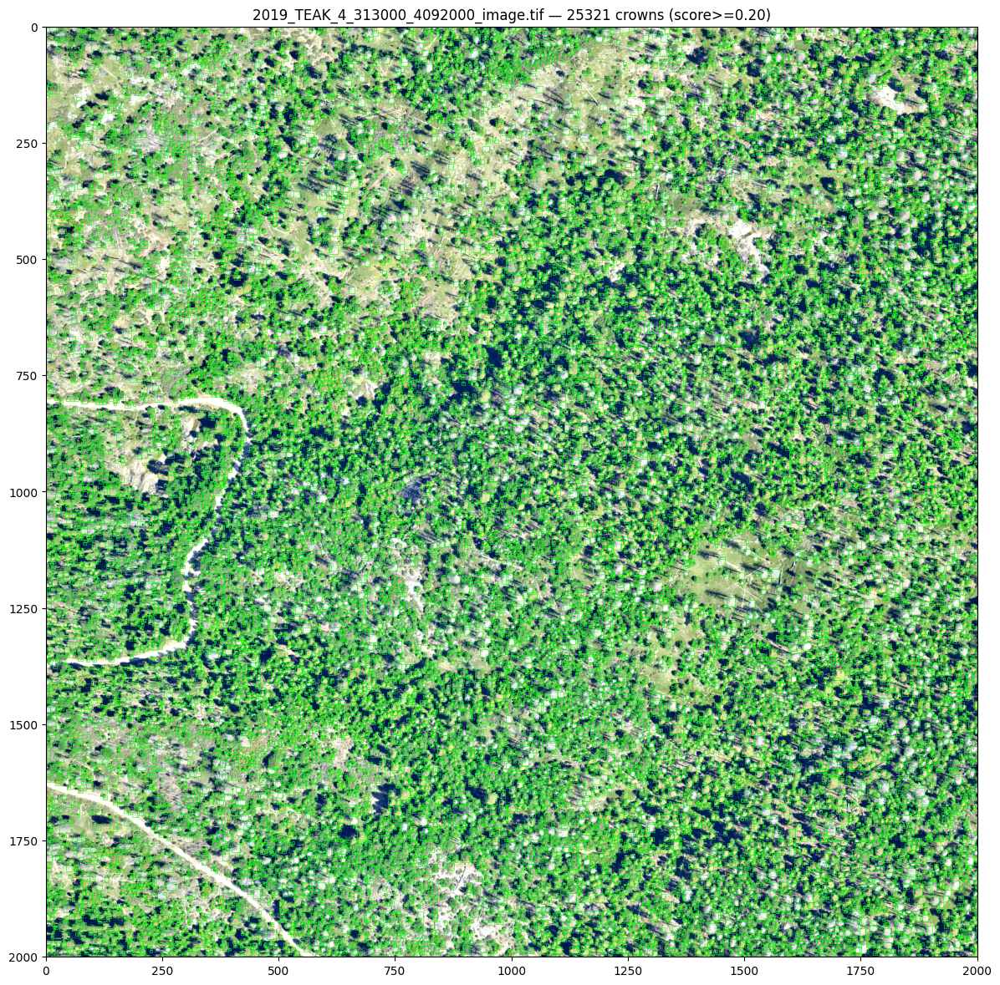

In [13]:
# Project UTM boxes to display-pixel coords via the GeoTIFF affine.
# native pixel (col, row) = ~full_transform * (x_utm, y_utm)
# display pixel = native pixel / DISPLAY_SCALE
inv = ~full_transform

def utm_to_disp(x, y):
    col, row = inv * (x, y)
    return col / DISPLAY_SCALE, row / DISPLAY_SCALE

fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(img_disp)

for r in tile_labels.itertuples(index=False):
    x0, y0 = utm_to_disp(r.left, r.top)      # top-left in image coords
    x1, y1 = utm_to_disp(r.right, r.bottom)  # bottom-right in image coords
    ax.add_patch(mpatches.Rectangle(
        (x0, y0), x1 - x0, y1 - y0,
        fill=False, edgecolor="lime", linewidth=0.4,
    ))

ax.set_title(f"{tile_path.name} — {len(tile_labels)} crowns (score>={tile_labels['score'].min():.2f})")
ax.set_xlim(0, img_disp.shape[1])
ax.set_ylim(img_disp.shape[0], 0)
plt.tight_layout()
plt.show()

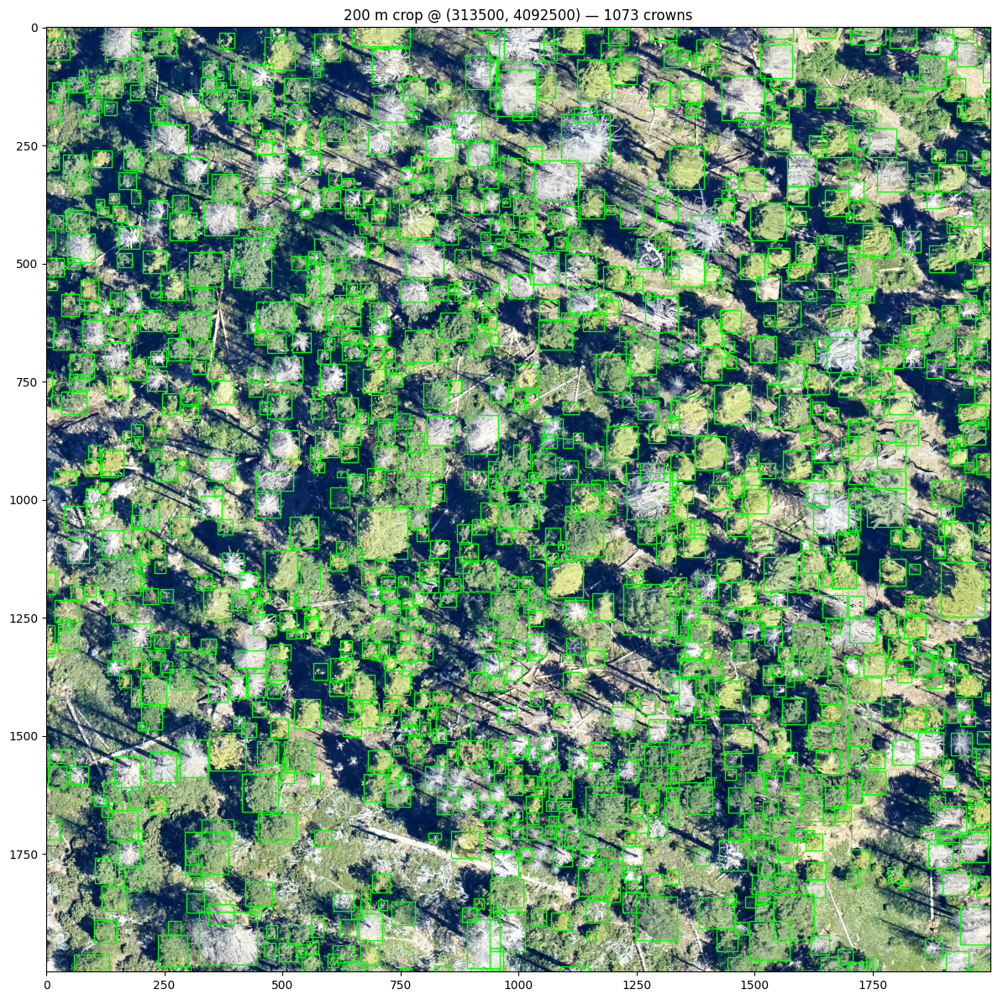

In [21]:
# Sanity zoom: pick a 200 m x 200 m crop near tile center and overlay boxes.
# This is the easiest way to tell visually whether boxes land on actual crowns.
with rasterio.open(tile_path) as src:
    cx, cy = (src.bounds.left + src.bounds.right) / 2, (src.bounds.top + src.bounds.bottom) / 2
    crop_m = 200
    w_utm, e_utm = cx - crop_m / 2, cx + crop_m / 2
    s_utm, n_utm = cy - crop_m / 2, cy + crop_m / 2
    col_w, row_n = (~src.transform) * (w_utm, n_utm)
    col_e, row_s = (~src.transform) * (e_utm, s_utm)
    col_w, col_e = int(min(col_w, col_e)), int(max(col_w, col_e))
    row_n, row_s = int(min(row_n, row_s)), int(max(row_n, row_s))
    win = rasterio.windows.Window(col_w, row_n, col_e - col_w, row_s - row_n)
    crop = src.read([1, 2, 3], window=win)
    win_transform = src.window_transform(win)

crop = np.transpose(crop, (1, 2, 0))
nz = crop[crop > 0]
lo, hi = np.percentile(nz, (2, 98)) if nz.size else (0, 1)
crop_disp = np.clip((crop.astype(np.float32) - lo) / max(hi - lo, 1e-6), 0, 1)

inv_win = ~win_transform
crop_labels = tile_labels[
    (tile_labels["right"]  >= w_utm) & (tile_labels["left"]   <= e_utm) &
    (tile_labels["top"]    >= s_utm) & (tile_labels["bottom"] <= n_utm)
]

fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(crop_disp)
for r in crop_labels.itertuples(index=False):
    x0, y0 = inv_win * (r.left, r.top)
    x1, y1 = inv_win * (r.right, r.bottom)
    ax.add_patch(mpatches.Rectangle(
        (x0, y0), x1 - x0, y1 - y0,
        fill=False, edgecolor="lime", linewidth=1.0,
    ))
ax.set_title(f"200 m crop @ ({cx:.0f}, {cy:.0f}) — {len(crop_labels)} crowns")
plt.tight_layout()
plt.show()

In [15]:
# Compute NDVI from the matching HSI tile.
# NIR  := mean over 835-920 nm  (18 NEON bands, brackets NAIP NIR)
# Red  := mean over 620-700 nm  (~16 NEON bands, NDVI-style red)
import h5py

HSI_DIR = Path("hyperspectral")
hsi_path = next(HSI_DIR.glob(f"NEON_*_{site}_DP3_{east}_{north}_reflectance.h5"))
print(f"HSI: {hsi_path.name}")

NIR_LO, NIR_HI = 835.0, 920.0
RED_LO, RED_HI = 620.0, 700.0
with h5py.File(hsi_path, "r") as f:
    site_key = list(f.keys())[0]
    refl = f[site_key]["Reflectance"]
    wavelengths = refl["Metadata/Spectral_Data/Wavelength"][:]
    map_info = refl["Metadata/Coordinate_System/Map_Info"][()].decode()
    data = refl["Reflectance_Data"]
    scale = float(data.attrs.get("Scale_Factor", 10000.0))
    nodata = float(data.attrs.get("Data_Ignore_Value", -9999.0))

    def band_slice(lo, hi):
        idx = np.where((wavelengths >= lo) & (wavelengths <= hi))[0]
        return slice(int(idx[0]), int(idx[-1]) + 1), wavelengths[idx]

    nir_sl, nir_w = band_slice(NIR_LO, NIR_HI)
    red_sl, red_w = band_slice(RED_LO, RED_HI)
    print(f"NIR: {nir_sl.stop - nir_sl.start} bands ({nir_w[0]:.1f}-{nir_w[-1]:.1f} nm)")
    print(f"Red: {red_sl.stop - red_sl.start} bands ({red_w[0]:.1f}-{red_w[-1]:.1f} nm)")

    nir_stack = data[:, :, nir_sl].astype(np.float32)
    red_stack = data[:, :, red_sl].astype(np.float32)

nir_stack[nir_stack == nodata] = np.nan
red_stack[red_stack == nodata] = np.nan
nir = np.nanmean(nir_stack, axis=2) / scale
red = np.nanmean(red_stack, axis=2) / scale
ndvi = (nir - red) / (nir + red + 1e-8)
print(f"NDVI shape={ndvi.shape}, range=[{np.nanmin(ndvi):.3f}, {np.nanmax(ndvi):.3f}]")

# Map_Info: "UTM, 1, 1, x_origin, y_origin, dx, dy, zone, ..."
parts = [p.strip() for p in map_info.split(",")]
x_origin = float(parts[3])
y_origin = float(parts[4])
px_size = float(parts[5])
print(f"HSI origin=({x_origin}, {y_origin}), pixel={px_size} m")

HSI: NEON_D17_TEAK_DP3_313000_4092000_reflectance.h5
NIR: 17 bands (837.3-917.4 nm)
Red: 16 bands (621.9-697.0 nm)
NDVI shape=(1000, 1000), range=[-0.220, 0.939]
HSI origin=(313000.0, 4093000.0), pixel=1.0 m


/var/folders/hl/xnsysyy92l344jvxt2bxy2f00000gn/T/ipykernel_26989/643052067.py:35: RuntimeWarning: Mean of empty slice
  nir = np.nanmean(nir_stack, axis=2) / scale
/var/folders/hl/xnsysyy92l344jvxt2bxy2f00000gn/T/ipykernel_26989/643052067.py:36: RuntimeWarning: Mean of empty slice
  red = np.nanmean(red_stack, axis=2) / scale


alive (NDVI >= 0.65): 676
dead  (NDVI <  0.65): 397
unknown (nan):                    0


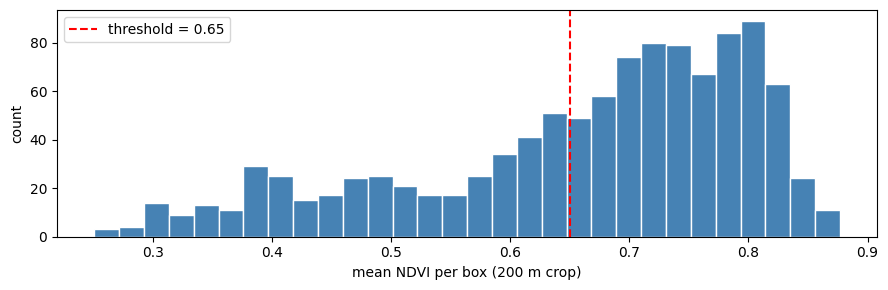

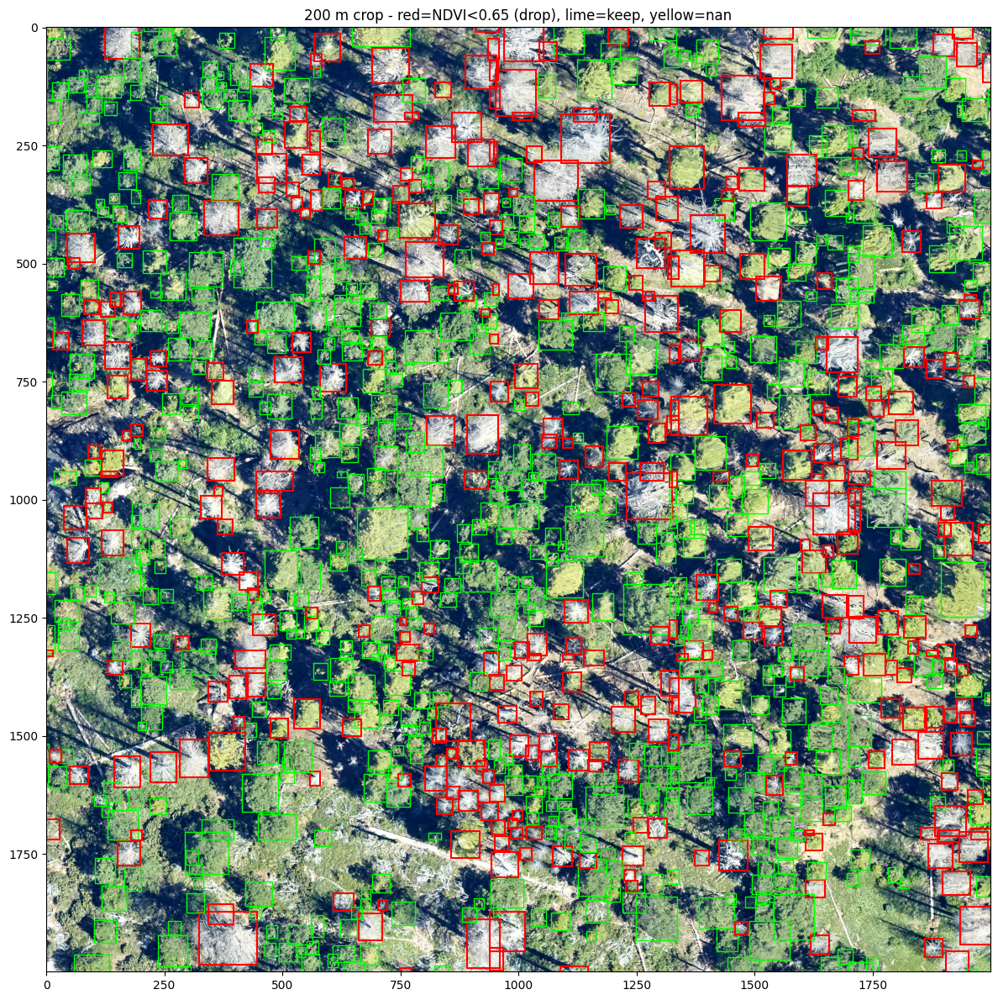

In [30]:
# Same NDVI analysis as the 200 m crop above.
# Uses crop_labels, crop_disp, inv_win from the prior cell.
NDVI_THRESHOLD = 0.65

def utm_to_hsi_px(x, y):
    return (x - x_origin) / px_size, (y_origin - y) / px_size

H_hsi, W_hsi = ndvi.shape
crop_labels = crop_labels.copy()
box_ndvi = np.full(len(crop_labels), np.nan, dtype=np.float32)
for i, r in enumerate(crop_labels.itertuples(index=False)):
    c0_f, r0_f = utm_to_hsi_px(r.left, r.top)
    c1_f, r1_f = utm_to_hsi_px(r.right, r.bottom)
    c0, c1 = int(np.floor(min(c0_f, c1_f))), int(np.ceil(max(c0_f, c1_f)))
    r0, r1 = int(np.floor(min(r0_f, r1_f))), int(np.ceil(max(r0_f, r1_f)))
    c0, c1 = max(c0, 0), min(c1, W_hsi)
    r0, r1 = max(r0, 0), min(r1, H_hsi)
    if c1 > c0 and r1 > r0:
        patch = ndvi[r0:r1, c0:c1]
        if np.isfinite(patch).any():
            box_ndvi[i] = float(np.nanmean(patch))

crop_labels = crop_labels.assign(ndvi=box_ndvi)
dead_mask = crop_labels["ndvi"] < NDVI_THRESHOLD
nan_mask = crop_labels["ndvi"].isna()
print(f"alive (NDVI >= {NDVI_THRESHOLD}): {(~dead_mask & ~nan_mask).sum()}")
print(f"dead  (NDVI <  {NDVI_THRESHOLD}): {dead_mask.sum()}")
print(f"unknown (nan):                    {nan_mask.sum()}")

fig, ax = plt.subplots(figsize=(9, 3))
ax.hist(crop_labels["ndvi"].dropna(), bins=30, color="steelblue", edgecolor="white")
ax.axvline(NDVI_THRESHOLD, color="red", ls="--", label=f"threshold = {NDVI_THRESHOLD}")
ax.set_xlabel("mean NDVI per box (200 m crop)"); ax.set_ylabel("count"); ax.legend()
plt.tight_layout(); plt.show()

fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(crop_disp)
for r in crop_labels.itertuples(index=False):
    x0, y0 = inv_win * (r.left, r.top)
    x1, y1 = inv_win * (r.right, r.bottom)
    if np.isnan(r.ndvi):
        color, lw = "yellow", 0.8
    elif r.ndvi < NDVI_THRESHOLD:
        color, lw = "red", 1.5
    else:
        color, lw = "lime", 1.0
    ax.add_patch(mpatches.Rectangle(
        (x0, y0), x1 - x0, y1 - y0, fill=False, edgecolor=color, linewidth=lw,
    ))
ax.set_title(
    f"200 m crop - red=NDVI<{NDVI_THRESHOLD} (drop), lime=keep, yellow=nan"
)
plt.tight_layout(); plt.show()

RGB camera @ 0.6 m: shape=(333, 333, 3), native pull from 0.1 m
HSI NIR @ 1.0 m: shape=(200, 200)
HSI NIR @ 0.6 m: shape=(333, 333) (bilinear zoom=[1.6649999618530273, 1.6649999618530273])
4-channel tile: shape=(333, 333, 4) (R, G, B, NIR) @ 0.6 m


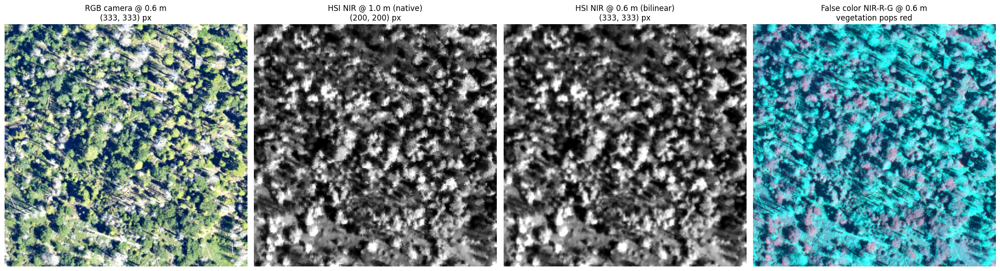

In [22]:
# Option C: demo the Stage-B resampling on the same 200 m crop.
#   RGB camera: 0.1 m -> 0.6 m  (block-average, 6x downsample)
#   HSI NIR:    1.0 m -> 0.6 m  (bilinear, 1.67x upsample)
from scipy.ndimage import zoom

TARGET_GSD = 0.6                     # match NAIP
out_px = int(round(crop_m / TARGET_GSD))   # ~333 px for a 200 m crop

# -- RGB: read the camera tile at the crop window directly into a (out_px, out_px) buffer.
with rasterio.open(tile_path) as src:
    col_w, row_n = (~src.transform) * (w_utm, n_utm)
    col_e, row_s = (~src.transform) * (e_utm, s_utm)
    col0, col1 = int(min(col_w, col_e)), int(max(col_w, col_e))
    row0, row1 = int(min(row_n, row_s)), int(max(row_n, row_s))
    win = rasterio.windows.Window(col0, row0, col1 - col0, row1 - row0)
    rgb_06m = src.read(
        [1, 2, 3],
        window=win,
        out_shape=(3, out_px, out_px),
        resampling=Resampling.average,   # area-average downsample (antialiased)
    )
rgb_06m = np.transpose(rgb_06m, (1, 2, 0)).astype(np.float32) / 255.0
print(f"RGB camera @ 0.6 m: shape={rgb_06m.shape}, native pull from 0.1 m")

# -- NIR: crop HSI mean-NIR at 1 m, then bilinear upsample to 0.6 m.
def utm_to_hsi(x, y):
    return (x - x_origin) / px_size, (y_origin - y) / px_size

c0_h, r0_h = utm_to_hsi(w_utm, n_utm)
c1_h, r1_h = utm_to_hsi(e_utm, s_utm)
hc0, hc1 = int(np.floor(min(c0_h, c1_h))), int(np.ceil(max(c0_h, c1_h)))
hr0, hr1 = int(np.floor(min(r0_h, r1_h))), int(np.ceil(max(r0_h, r1_h)))
nir_1m = nir[hr0:hr1, hc0:hc1]                    # native HSI grid
zoom_factor = out_px / np.array(nir_1m.shape, dtype=np.float32)
nir_06m = zoom(nir_1m, zoom=tuple(zoom_factor), order=1)   # bilinear
print(f"HSI NIR @ 1.0 m: shape={nir_1m.shape}")
print(f"HSI NIR @ 0.6 m: shape={nir_06m.shape} (bilinear zoom={zoom_factor.round(3).tolist()})")

# -- Compose 4-channel synthetic-NAIP tile.
synth = np.dstack([rgb_06m, nir_06m[:, :, None]]).astype(np.float32)
print(f"4-channel tile: shape={synth.shape} (R, G, B, NIR) @ {TARGET_GSD} m")

# -- Visualize: RGB / NIR native / NIR upsampled / false-color NIR-R-G.
def stretch(a):
    lo, hi = np.nanpercentile(a, (2, 98))
    return np.clip((a - lo) / max(hi - lo, 1e-6), 0, 1)

fig, axes = plt.subplots(1, 4, figsize=(22, 6))
axes[0].imshow(stretch(rgb_06m))
axes[0].set_title(f"RGB camera @ 0.6 m\n{rgb_06m.shape[:2]} px")
axes[1].imshow(stretch(nir_1m), cmap="gray")
axes[1].set_title(f"HSI NIR @ 1.0 m (native)\n{nir_1m.shape} px")
axes[2].imshow(stretch(nir_06m), cmap="gray")
axes[2].set_title(f"HSI NIR @ 0.6 m (bilinear)\n{nir_06m.shape} px")
fc = np.dstack([nir_06m, rgb_06m[:, :, 0], rgb_06m[:, :, 1]])
axes[3].imshow(stretch(fc))
axes[3].set_title("False color NIR-R-G @ 0.6 m\nvegetation pops red")
for ax in axes:
    ax.axis("off")
plt.tight_layout(); plt.show()

In [ ]:
# Sanity-check pipeline_test.py output: load a few generated patches
# and overlay their CSV labels. RGB only (ignore the NIR band).
PATCH_ROOT = Path("patches")
PATCH_LABELS = PATCH_ROOT / "labels.csv"

patch_labels = pd.read_csv(PATCH_LABELS)
print(f"{len(patch_labels)} boxes across {patch_labels['imgname'].nunique()} patches "
      f"in {patch_labels['site'].nunique()} site(s): {sorted(patch_labels['site'].unique())}")

# Pick the 6 patches with the most boxes — most informative to look at.
top = (
    patch_labels.groupby(["site", "imgname"])
    .size()
    .sort_values(ascending=False)
    .head(6)
    .index.tolist()
)

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
for ax, (site, name) in zip(axes.flat, top):
    with rasterio.open(PATCH_ROOT / site / f"{name}.tif") as src:
        rgb = src.read([1, 2, 3])
    rgb = np.transpose(rgb, (1, 2, 0))
    lo, hi = np.percentile(rgb, (2, 98))
    rgb_disp = np.clip((rgb.astype(np.float32) - lo) / max(hi - lo, 1e-6), 0, 1)

    boxes = patch_labels[(patch_labels["site"] == site) & (patch_labels["imgname"] == name)]
    ax.imshow(rgb_disp)
    for r in boxes.itertuples(index=False):
        ax.add_patch(mpatches.Rectangle(
            (r.xmin, r.ymin), r.xmax - r.xmin, r.ymax - r.ymin,
            fill=False, edgecolor="lime", linewidth=1.0,
        ))
    ax.set_title(f"{name}\n{len(boxes)} boxes", fontsize=9)
    ax.axis("off")
plt.tight_layout(); plt.show()